# 1. Importing Libraries

In [103]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sn
from matplotlib.image import imread
import cv2
import random
from os import listdir

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.preprocessing import LabelBinarizer

import tensorflow as tf
from tensorflow import keras
from keras.preprocessing import image
from keras.preprocessing.image import img_to_array, array_to_img
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Activation,Flatten, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import callbacks

### Setting up a path

- Sample example for American Goldfinch

In [8]:
path='/kaggle/input/the-birds/AMERICAN GOLDFINCH'

In [9]:
listdir(path)

['029.jpg',
 '014.jpg',
 '109.jpg',
 '034.jpg',
 '024.jpg',
 '033.jpg',
 '094.jpg',
 '049.jpg',
 '048.jpg',
 '143.jpg',
 '115.jpg',
 '131.jpg',
 '080.jpg',
 '062.jpg',
 '118.jpg',
 '067.jpg',
 '106.jpg',
 '113.jpg',
 '006.jpg',
 '066.jpg',
 '130.jpg',
 '011.jpg',
 '120.jpg',
 '002.jpg',
 '036.jpg',
 '069.jpg',
 '124.jpg',
 '089.jpg',
 '025.jpg',
 '076.jpg',
 '123.jpg',
 '028.jpg',
 '012.jpg',
 '085.jpg',
 '112.jpg',
 '056.jpg',
 '101.jpg',
 '051.jpg',
 '047.jpg',
 '018.jpg',
 '117.jpg',
 '027.jpg',
 '137.jpg',
 '079.jpg',
 '068.jpg',
 '127.jpg',
 '010.jpg',
 '140.jpg',
 '064.jpg',
 '001.jpg',
 '075.jpg',
 '042.jpg',
 '087.jpg',
 '015.jpg',
 '105.jpg',
 '086.jpg',
 '072.jpg',
 '111.jpg',
 '017.jpg',
 '135.jpg',
 '088.jpg',
 '007.jpg',
 '057.jpg',
 '005.jpg',
 '121.jpg',
 '063.jpg',
 '070.jpg',
 '103.jpg',
 '004.jpg',
 '021.jpg',
 '126.jpg',
 '142.jpg',
 '084.jpg',
 '095.jpg',
 '104.jpg',
 '078.jpg',
 '090.jpg',
 '093.jpg',
 '039.jpg',
 '050.jpg',
 '071.jpg',
 '114.jpg',
 '138.jpg',
 '10

# 2. Visualizing the Bird Species

### a) AMERICAN GOLDFINCH

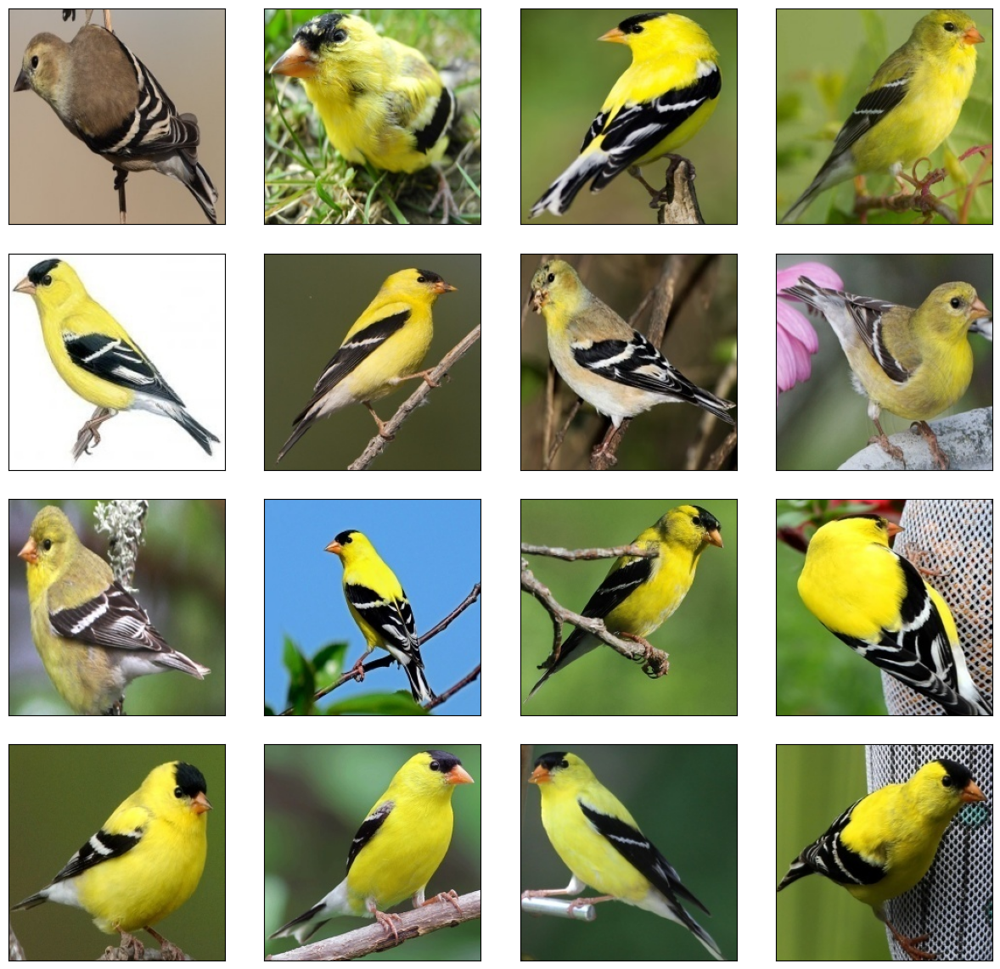

In [11]:
plt.figure(figsize=(12,12))

for i in range(1,17):
    # defining the path
    path='/kaggle/input/the-birds/AMERICAN GOLDFINCH'
    # using subplots
    plt.subplot(4,4,i)
    plt.tight_layout()
    # using random images
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)
    
    # off the labels
    plt.xticks([])
    plt.yticks([])

### b) BARN OWL

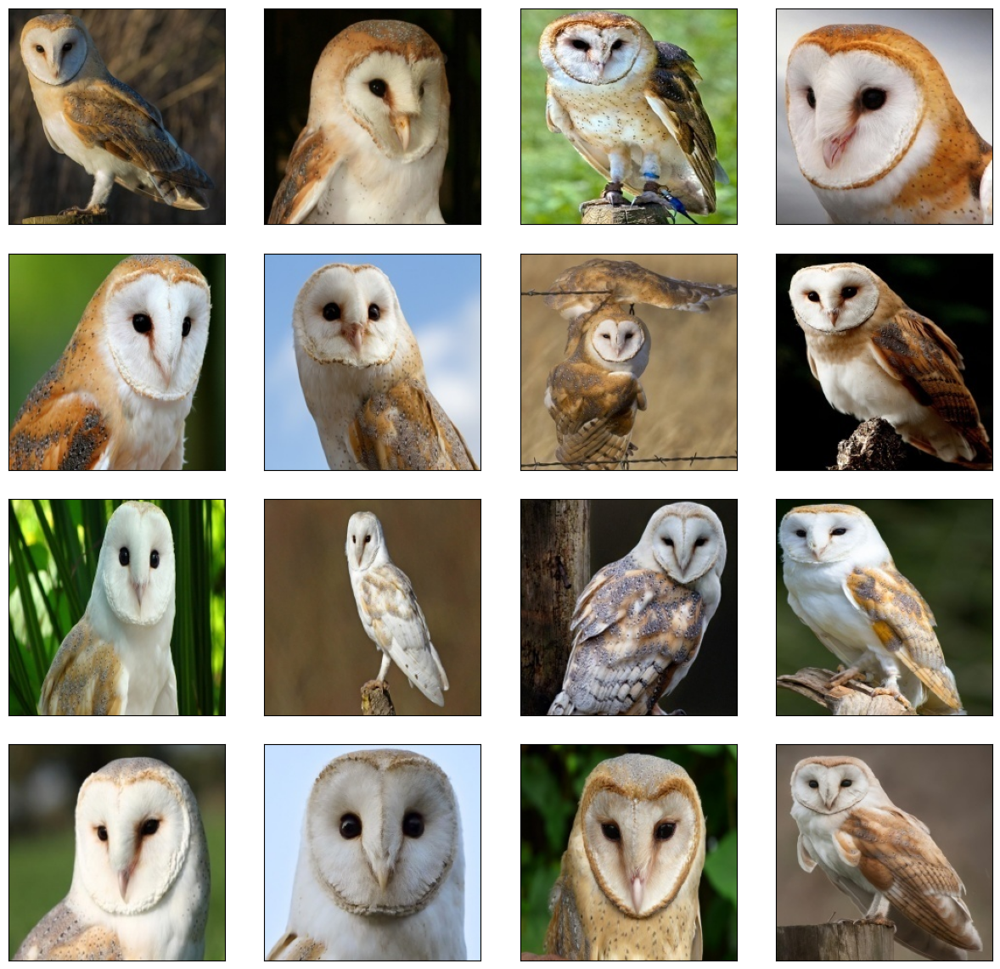

In [12]:
plt.figure(figsize=(12,12))

for i in range(1,17):
    # defining the path
    path='/kaggle/input/the-birds/BARN OWL'
    # using subplots
    plt.subplot(4,4,i)
    plt.tight_layout()
    # using random images
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)
    
    # off the labels
    plt.xticks([])
    plt.yticks([])

### c) CARMINE BEE-EATER

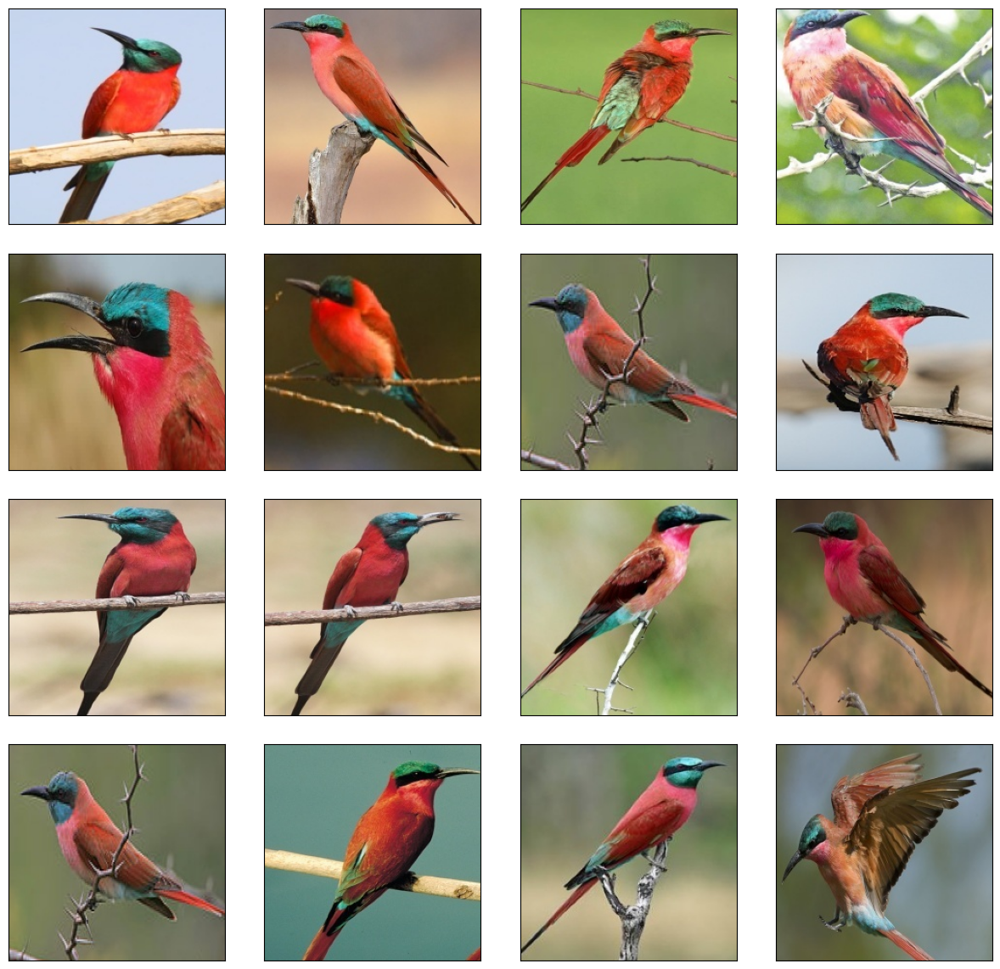

In [13]:
plt.figure(figsize=(12,12))

for i in range(1,17):
    # defining the path
    path='/kaggle/input/the-birds/CARMINE BEE-EATER'
    # using subplots
    plt.subplot(4,4,i)
    plt.tight_layout()
    # using random images
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)
    
    # off the labels
    plt.xticks([])
    plt.yticks([])

### d) DOWNY WOODPECKER

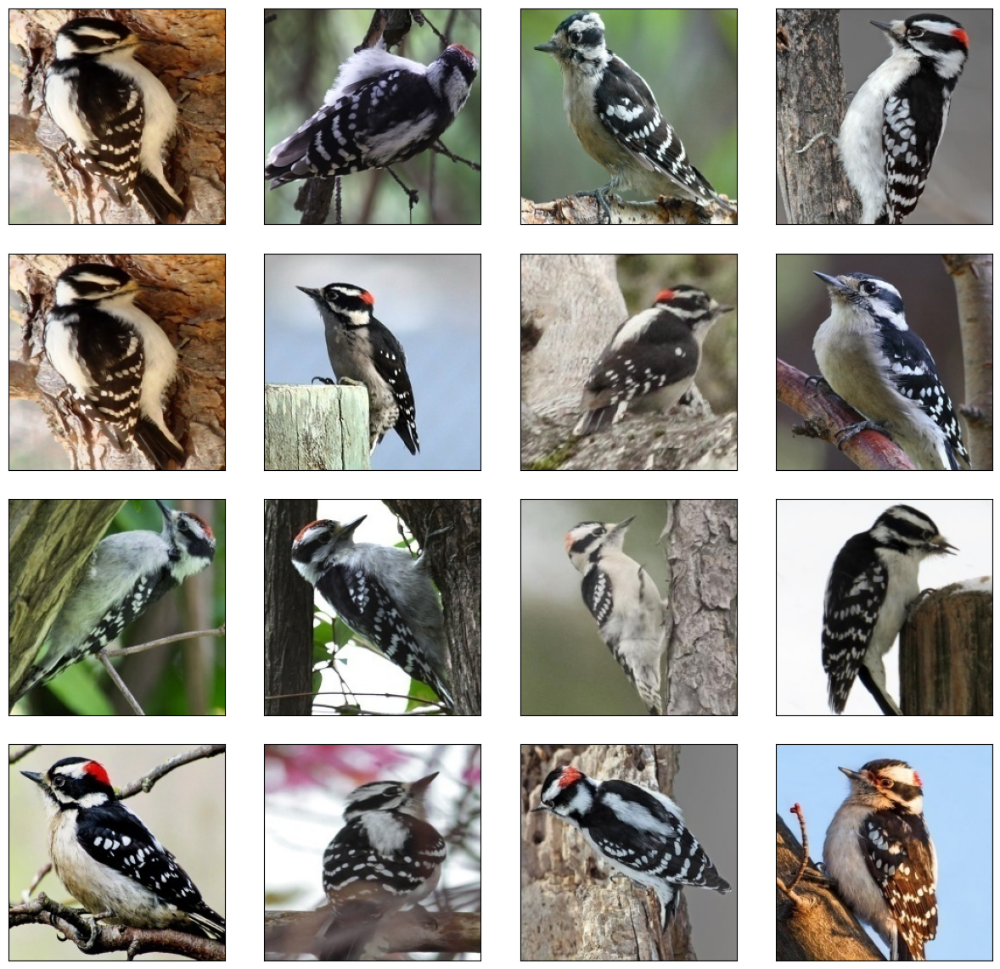

In [14]:
plt.figure(figsize=(12,12))

for i in range(1,17):
    # defining the path
    path='/kaggle/input/the-birds/DOWNY WOODPECKER'
    # using subplots
    plt.subplot(4,4,i)
    plt.tight_layout()
    # using random images
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)
    
    # off the labels
    plt.xticks([])
    plt.yticks([])

### e) EMPEROR PENGUIN 

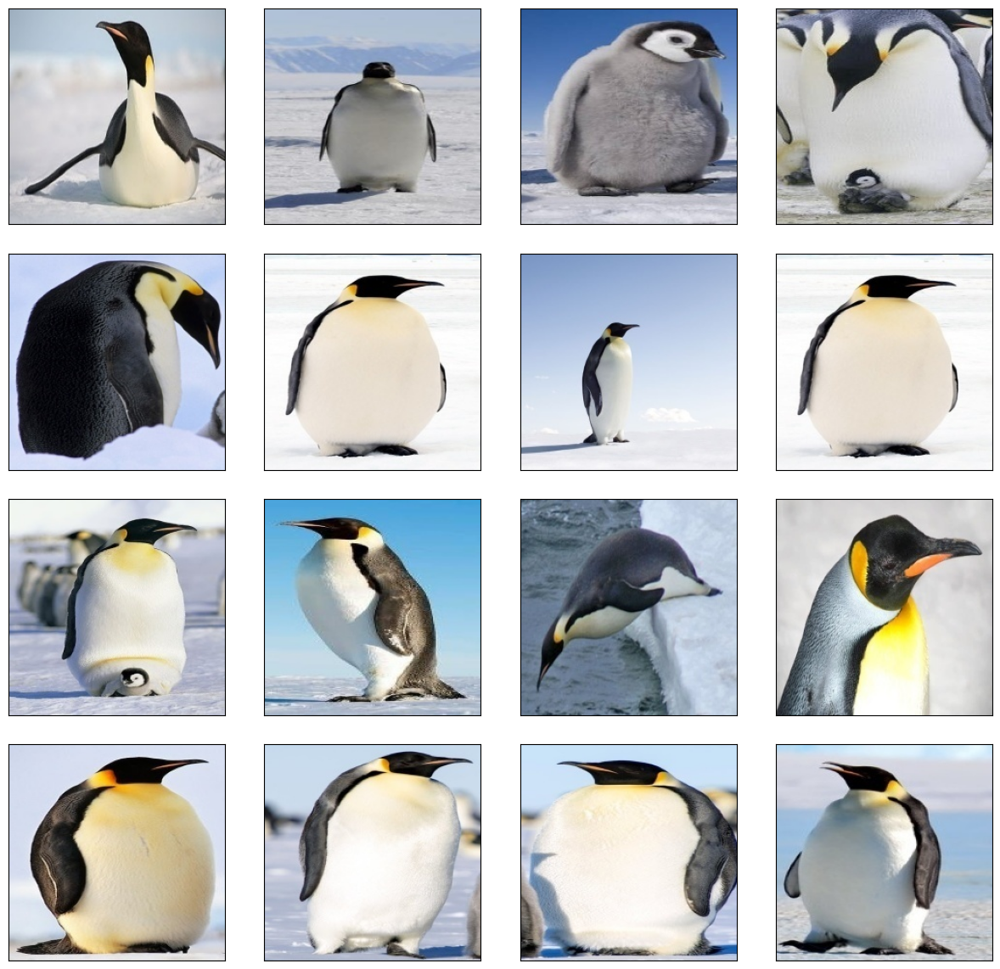

In [15]:
plt.figure(figsize=(12,12))

for i in range(1,17):
    # defining the path
    path='/kaggle/input/the-birds/EMPEROR PENGUIN'
    # using subplots
    plt.subplot(4,4,i)
    plt.tight_layout()
    # using random images
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)
    
    # off the labels
    plt.xticks([])
    plt.yticks([])

### f) FLAMINGO

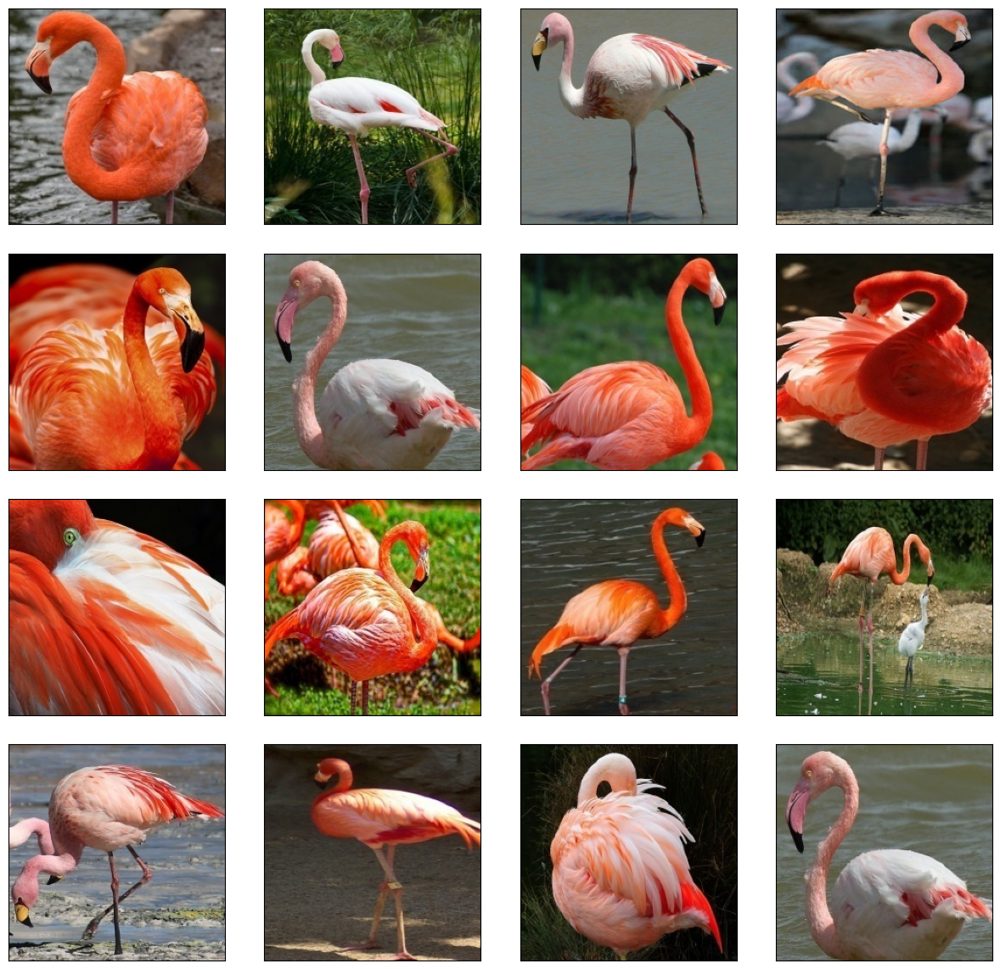

In [16]:
plt.figure(figsize=(12,12))

for i in range(1,17):
    # defining the path
    path='/kaggle/input/the-birds/FLAMINGO'
    # using subplots
    plt.subplot(4,4,i)
    plt.tight_layout()
    # using random images
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)
    
    # off the labels
    plt.xticks([])
    plt.yticks([])

--------------------------------------------------------------------------------------------------------------------

# 3. Data Pre-processing

- **Setting path and creating an empty list**

In [20]:
dir="/kaggle/input/the-birds"
root_dir=listdir(dir)
image_list, label_list=[],[]

In [21]:
root_dir

['CARMINE BEE-EATER',
 'AMERICAN GOLDFINCH',
 'DOWNY WOODPECKER',
 'EMPEROR PENGUIN',
 'BARN OWL',
 'FLAMINGO']

### a) Reading and Converting the images into numpy array

In [22]:
for directory in root_dir:
    for files in listdir(f"{dir}/{directory}"):
        image_path=f"{dir}/{directory}/{files}"
        
        image=cv2.imread(image_path)
        image=img_to_array(image)
        
        image_list.append(image)
        label_list.append(directory)

In [24]:
image_list[0]

array([[[ 73., 147., 213.],
        [ 38., 111., 179.],
        [ 64., 136., 208.],
        ...,
        [116., 171., 228.],
        [115., 170., 227.],
        [115., 170., 227.]],

       [[ 96., 167., 231.],
        [ 77., 147., 214.],
        [ 87., 156., 226.],
        ...,
        [116., 171., 228.],
        [115., 170., 227.],
        [114., 169., 226.]],

       [[103., 168., 229.],
        [107., 171., 235.],
        [115., 178., 246.],
        ...,
        [115., 170., 227.],
        [115., 170., 227.],
        [114., 169., 226.]],

       ...,

       [[ 83., 101., 132.],
        [ 86., 106., 137.],
        [ 93., 113., 144.],
        ...,
        [106., 162., 217.],
        [106., 162., 217.],
        [106., 162., 217.]],

       [[123., 140., 167.],
        [ 99., 116., 143.],
        [ 90., 107., 133.],
        ...,
        [106., 161., 218.],
        [106., 161., 218.],
        [106., 161., 218.]],

       [[136., 151., 177.],
        [122., 138., 161.],
        [121., 1

In [26]:
label_list[0:4]

['CARMINE BEE-EATER',
 'CARMINE BEE-EATER',
 'CARMINE BEE-EATER',
 'CARMINE BEE-EATER']

### b) Visualize the number of classes count

In [27]:
label_counts=pd.DataFrame(label_list).value_counts()

label_counts

0                 
AMERICAN GOLDFINCH    143
EMPEROR PENGUIN       139
DOWNY WOODPECKER      137
FLAMINGO              132
CARMINE BEE-EATER     131
BARN OWL              129
Name: count, dtype: int64

<Axes: ylabel='count'>

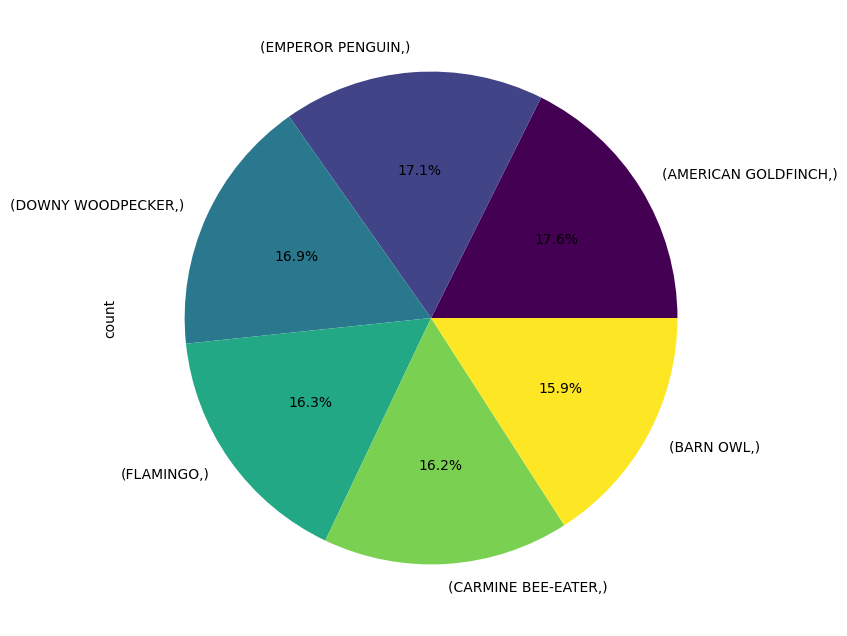

In [33]:
plt.figure(figsize=(10,8))
label_counts.plot(kind='pie', autopct="%.1f%%", cmap='viridis')

### c) Storing the number of classes

In [45]:
num_classes=len(label_counts)
num_classes

6

- **Checking input image shape**

In [35]:
image_list[0].shape

(224, 224, 3)

- **Checking labels shape**

In [37]:
label_list=np.array(label_list)
label_list.shape

(811,)

--------------------------------------------------------------------------------------------------------------------

# 4. Spliting the data into Training and Testing

In [38]:
X_train,X_test,Y_train,Y_test=train_test_split(image_list, label_list, test_size=0.3, random_state=0)

In [39]:
print(f"Number of Training datasets: {len(X_train)}\nNumber of Testing datasets: {len(X_test)}")

Number of Training datasets: 567
Number of Testing datasets: 244


--------------------------------------------------------------------------------------------------------------------

# 5. Normalization

- **Normalizing and reshaping the data**

In [40]:
X_train=np.array(X_train, dtype=np.float16)/ 255.0
X_test=np.array(X_test, dtype=np.float16)/ 255.0

X_train=X_train.reshape(-1, 224, 224, 3)
X_test=X_test.reshape(-1,224, 224, 3)

In [41]:
X_train[0]

array([[[0.4626 , 0.6943 , 0.639  ],
        [0.4626 , 0.6943 , 0.639  ],
        [0.4626 , 0.6943 , 0.639  ],
        ...,
        [0.396  , 0.612  , 0.537  ],
        [0.396  , 0.612  , 0.537  ],
        [0.396  , 0.612  , 0.537  ]],

       [[0.4626 , 0.6943 , 0.639  ],
        [0.4626 , 0.6943 , 0.639  ],
        [0.4626 , 0.6943 , 0.639  ],
        ...,
        [0.396  , 0.612  , 0.537  ],
        [0.396  , 0.612  , 0.537  ],
        [0.396  , 0.612  , 0.537  ]],

       [[0.4626 , 0.6943 , 0.639  ],
        [0.4626 , 0.6943 , 0.639  ],
        [0.4626 , 0.6943 , 0.639  ],
        ...,
        [0.396  , 0.612  , 0.537  ],
        [0.396  , 0.612  , 0.537  ],
        [0.396  , 0.612  , 0.537  ]],

       ...,

       [[0.0902 , 0.1686 , 0.1882 ],
        [0.06274, 0.149  , 0.1686 ],
        [0.06274, 0.1804 , 0.1843 ],
        ...,
        [0.2942 , 0.4785 , 0.447  ],
        [0.2942 , 0.4785 , 0.447  ],
        [0.2942 , 0.4785 , 0.447  ]],

       [[0.349  , 0.4548 , 0.4707 ],
  

--------------------------------------------------------------------------------------------------------------------

# 6. Label Binarizing

- **label Binarizing to one hot encode the target variables**

In [42]:
lb=LabelBinarizer()
Y_train=lb.fit_transform(Y_train)
Y_test=lb.fit_transform(Y_test)

print(lb.classes_)

['AMERICAN GOLDFINCH' 'BARN OWL' 'CARMINE BEE-EATER' 'DOWNY WOODPECKER'
 'EMPEROR PENGUIN' 'FLAMINGO']


In [43]:
Y_train

array([[1, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0],
       ...,
       [0, 1, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1]])

In [44]:
Y_train.shape

(567, 6)

--------------------------------------------------------------------------------------------------------------------

# 7. Model Training

## i) ANN

### a) Build and compile the model

In [46]:
def load_model():
    
    model=Sequential([
        Flatten(input_shape=(224,224,3)),
        Dense(512, activation='relu'),
        Dense(256, activation='relu'),
        Dense(128, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    
    model.compile(
        optimizer=Adam(learning_rate=0.0005),
        loss='categorical_crossentropy',
        metrics=['acc']
    )
    return model

### b) To prone the overfit

In [49]:
early_stopping=callbacks.EarlyStopping(
    patience=10,
    min_delta=0,
    monitor='val_loss',
    restore_best_weights=True,
    verbose=0,
    mode='min',
    baseline=None,
)
# This callback is used to reduce the learning rate when a metric has stopped improving
plateau=callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=4,
    verbose=0,
    mode='min'
)

### c)Model Training

In [52]:
ann_model=load_model()

history_ann=ann_model.fit(X_train, Y_train,validation_data=(X_test,Y_test),
                         epochs=1000,
                         callbacks=[early_stopping, plateau])

Epoch 1/1000
18/18 [==============================] - 3s 102ms/step - loss: 25.7695 - acc: 0.1958 - val_loss: 6.0342 - val_acc: 0.4180 - lr: 5.0000e-04
Epoch 2/1000
18/18 [==============================] - 0s 25ms/step - loss: 5.4838 - acc: 0.3422 - val_loss: 6.5134 - val_acc: 0.3484 - lr: 5.0000e-04
Epoch 3/1000
18/18 [==============================] - 1s 46ms/step - loss: 4.1427 - acc: 0.4550 - val_loss: 4.7271 - val_acc: 0.4016 - lr: 5.0000e-04
Epoch 4/1000
18/18 [==============================] - 1s 47ms/step - loss: 2.9858 - acc: 0.4815 - val_loss: 3.3868 - val_acc: 0.3975 - lr: 5.0000e-04
Epoch 5/1000
18/18 [==============================] - 1s 46ms/step - loss: 1.7239 - acc: 0.5573 - val_loss: 1.6722 - val_acc: 0.5820 - lr: 5.0000e-04
Epoch 6/1000
18/18 [==============================] - 1s 46ms/step - loss: 0.8250 - acc: 0.7460 - val_loss: 1.1208 - val_acc: 0.6516 - lr: 5.0000e-04
Epoch 7/1000
18/18 [==============================] - 0s 24ms/step - loss: 0.8673 - acc: 0.7354 - 

### d) Learning Curves

1. **Loss**

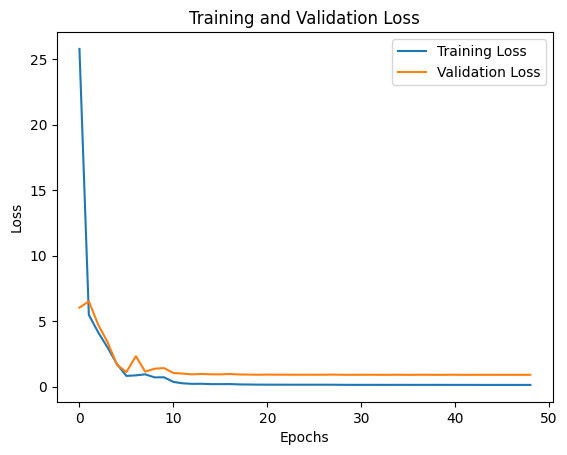

In [59]:
plt.plot(history_ann.history['loss'], label='Training Loss')
plt.plot(history_ann.history['val_loss'], label='Validation Loss')

plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

**2. Accuracy**

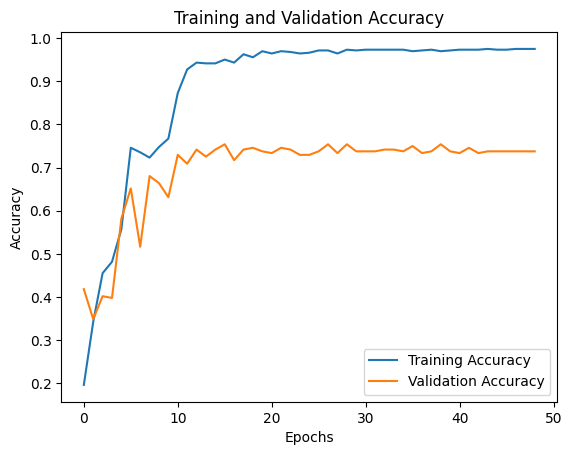

In [60]:
plt.plot(history_ann.history['acc'], label='Training Accuracy')
plt.plot(history_ann.history['val_acc'], label='Validation Accuracy')

plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

--------------------------------------------------------------------------------------------------------------------

## ii)CNN

### i) Build and compile the model

In [71]:
def load_model():
    model=Sequential([
        Conv2D(8, (3,3), padding='same', input_shape=(224,224, 3), activation='relu'),
        MaxPooling2D(pool_size=(3,3)),
        Conv2D(16, (3,3), padding='same', activation='relu'),
        MaxPooling2D(pool_size=(3,3)),
        Conv2D(32, (3,3), padding='same',  activation='relu'),
        MaxPooling2D(pool_size=(3,3)),
        
        Flatten(),
        Dense(128, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    
    model.compile(
    optimizer=Adam(learning_rate=0.0005),
        loss='categorical_crossentropy',
        metrics=['acc']
    )
    return model

### ii) Prune to the Overfit

In [72]:
early_stopping=callbacks.EarlyStopping(
    patience=10,
    min_delta=0,
    monitor='val_loss',
    restore_best_weights=True,
    verbose=0,
    mode='min',
    baseline=None,
)
# This callback is used to reduce the learning rate when a metric has stopped improving
plateau=callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=4,
    verbose=0,
    mode='min'
)

### iii) Model Training

In [77]:
nn_model=load_model()

historyy=nn_model.fit(X_train,Y_train, validation_data=(X_test,Y_test),
                    epochs=1000,
                    callbacks=[early_stopping, plateau]
                    )

Epoch 1/1000
18/18 [==============================] - 2s 56ms/step - loss: 1.6662 - acc: 0.3280 - val_loss: 1.4698 - val_acc: 0.4344 - lr: 5.0000e-04
Epoch 2/1000
18/18 [==============================] - 0s 20ms/step - loss: 1.2951 - acc: 0.5273 - val_loss: 1.1667 - val_acc: 0.5943 - lr: 5.0000e-04
Epoch 3/1000
18/18 [==============================] - 0s 21ms/step - loss: 1.0068 - acc: 0.6614 - val_loss: 0.9448 - val_acc: 0.6516 - lr: 5.0000e-04
Epoch 4/1000
18/18 [==============================] - 0s 20ms/step - loss: 0.8322 - acc: 0.7178 - val_loss: 0.8028 - val_acc: 0.7377 - lr: 5.0000e-04
Epoch 5/1000
18/18 [==============================] - 0s 20ms/step - loss: 0.6394 - acc: 0.7989 - val_loss: 0.6543 - val_acc: 0.7746 - lr: 5.0000e-04
Epoch 6/1000
18/18 [==============================] - 0s 21ms/step - loss: 0.5061 - acc: 0.8413 - val_loss: 0.5749 - val_acc: 0.7705 - lr: 5.0000e-04
Epoch 7/1000
18/18 [==============================] - 0s 21ms/step - loss: 0.4576 - acc: 0.8413 - va

### iv) Model Accuracy

In [78]:
loss,acc=nn_model.evaluate(X_test,Y_test)

8/8 [==============================] - 0s 10ms/step - loss: 0.2608 - acc: 0.9180


### v) Learning Curve

- **Loss**

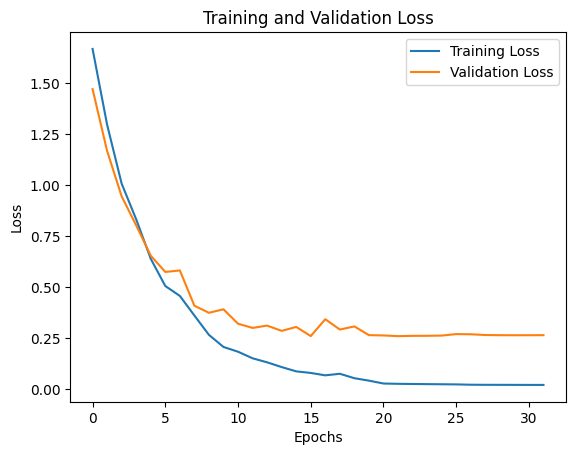

In [80]:
plt.plot(historyy.history['loss'], label='Training Loss')
plt.plot(historyy.history['val_loss'], label='Validation Loss')

plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

- **Accuracy**

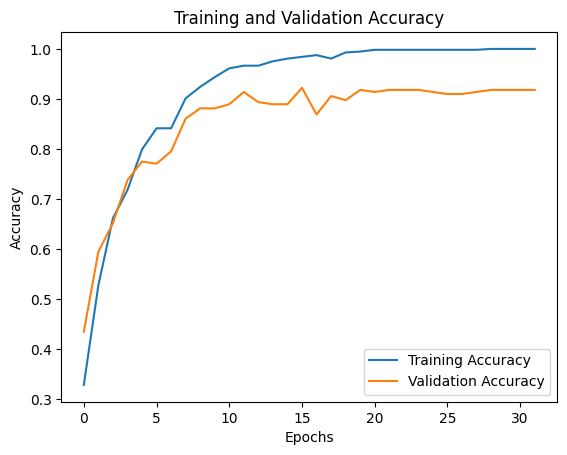

In [81]:
plt.plot(historyy.history['acc'], label='Training Accuracy')
plt.plot(historyy.history['val_acc'], label='Validation Accuracy')

plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

### e) Saving the Model

In [82]:
nn_model.save('bird.h5')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


--------------------------------------------------------------------------------------------------------------------

# 8. Predictions

In [83]:
y_pred=nn_model.predict(X_test)

8/8 [==============================] - 0s 8ms/step


In [97]:
y_predicted_labels=[np.argmax(i) for i in y_pred]

In [98]:
y_predicted_labels=np.array(y_predicted_labels)
y_predicted_labels.shape

(244,)

In [112]:
y_predicted_labels

array([1, 0, 2, 4, 2, 2, 4, 4, 0, 1, 1, 4, 2, 0, 5, 5, 4, 2, 5, 0, 5, 3,
       2, 4, 4, 5, 1, 5, 0, 1, 0, 0, 0, 3, 4, 3, 0, 5, 3, 1, 3, 1, 2, 4,
       1, 5, 1, 1, 2, 0, 4, 0, 3, 3, 3, 2, 3, 1, 1, 4, 1, 0, 3, 5, 4, 5,
       5, 5, 1, 5, 0, 4, 5, 4, 5, 0, 5, 4, 4, 2, 2, 5, 2, 3, 5, 1, 2, 0,
       5, 0, 1, 0, 1, 0, 3, 3, 4, 1, 0, 1, 1, 4, 3, 1, 4, 3, 5, 4, 4, 4,
       1, 1, 4, 1, 1, 4, 2, 3, 0, 2, 5, 0, 4, 0, 3, 1, 2, 0, 5, 1, 2, 3,
       4, 2, 4, 2, 0, 0, 1, 1, 2, 3, 0, 2, 5, 0, 5, 1, 5, 5, 4, 0, 4, 5,
       4, 0, 4, 5, 2, 2, 4, 0, 2, 2, 0, 2, 3, 1, 3, 0, 3, 3, 4, 2, 1, 2,
       4, 1, 0, 4, 1, 0, 2, 3, 1, 5, 2, 2, 0, 0, 4, 5, 5, 0, 4, 2, 1, 3,
       0, 5, 5, 4, 3, 4, 1, 5, 1, 4, 4, 5, 2, 4, 4, 1, 1, 3, 3, 3, 3, 5,
       5, 3, 3, 0, 0, 5, 1, 2, 5, 3, 2, 2, 5, 3, 3, 0, 0, 1, 1, 2, 3, 4,
       3, 4])

## Prediction Function

- **First Example**

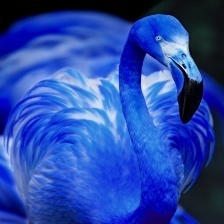

In [139]:
img=array_to_img(X_test[15])
img

**Finding the Max value from prediction list and comparing original values vs predicted**

In [140]:
labels=lb.classes_
print(labels)

print('Originally: ', labels[np.argmax(Y_test[15])])
print('Predicted: ', labels[np.argmax(y_pred[15])])

['AMERICAN GOLDFINCH' 'BARN OWL' 'CARMINE BEE-EATER' 'DOWNY WOODPECKER'
 'EMPEROR PENGUIN' 'FLAMINGO']
Originally:  FLAMINGO
Predicted:  FLAMINGO


- **Second Example**

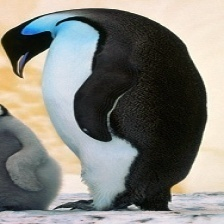

In [136]:
img=array_to_img(X_test[43])
img

In [141]:
labels=lb.classes_
print(labels)

print('Originally: ', labels[np.argmax(Y_test[43])])
print('Predicted: ', labels[np.argmax(y_pred[43])])

['AMERICAN GOLDFINCH' 'BARN OWL' 'CARMINE BEE-EATER' 'DOWNY WOODPECKER'
 'EMPEROR PENGUIN' 'FLAMINGO']
Originally:  EMPEROR PENGUIN
Predicted:  EMPEROR PENGUIN


-------------------------------------------------------------------------------------------------------------------